# Generate consensus sequence
Get path with maximal flow on graph between source node (core genome at the start) and sink node (core genome at the end).
We also want an option to get the path with nth maximal flow or to have a threshold of a bottleneck edge weight below which we don't consider a path anymore.

The bottleneck idea is quite simple by removing all edges with a weight below a threshold. However, we then need a way to subsequently define the relevant paths.

First step: build graph with weighted edges based on number of isolates that contain an edge.

Widest path problem or maximum capacity path problem adapted to n best paths.

In any graph, directed or undirected, there is a straightforward algorithm for finding a widest path once the weight of its minimum-weight edge is known: simply delete all smaller edges and search for any path among the remaining edges using breadth-first search or depth-first search.

Final idea:
- step by step pop bubbles in graph (blocks = nodes) with low number of isolates and increase count of shortcut edge
- pop bubbles until there are no nodes with less than k isolates
- find all remaining paths by following all paths to the end accounting for the flow along each path
- count remaining paths, if too many keep popping bubbles and repeat

Two parameters:
- minimal number of isolates that need to contain path
- maximal number of consensus paths

How do I keep track of the isolates:
- for each one of final paths, find bottleneck node and choose all isolates that contain it
- start with smallest bottleneck and remove isolates from pool (= set of isolates)
- final path (minimal case just core genome) gets remaining isolates

Pop Bubbles:
- for popping bubbles, start from node with least number of isolates
- find incoming and outgoing node, If they have an edge
- if they have an edge, increase count of the edge by edge count of incoming edge
- if they don't have an edge, delete the low isolate node entirely, ignoring its edges

some random ideas:
- One idea could be to get the maximal flow on the whole graph, which can be split into several paths and then subsequently delete paths that are part of this that have too low flow. However, we have to make sure that the direct way is chosen.

## Build graph

In [1]:
# set working directory to project folder
import sys, os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go

import altair as alt
from itertools import combinations
import numpy as np
import pypangraph as pp
from Bio import Phylo, SeqIO
from Bio import Align
import string
import networkx as nx
import igraph as ig
import cairo

import scipy.cluster.hierarchy as sch
from collections import Counter

from junction_analyis.helpers import get_tree_order
import junction_analyis.pangraph_utils as pu

In [3]:
_fname = f"../config/junction_stats.csv"
jdf = pd.read_csv(_fname)
jdf

,edge,n_iso,n_blocks,has_dupl,n_categories,majority_category,singleton,cat_entropy,n_nodes,min_length,max_length,mean_length,n_all_cores,core_left_length,core_right_length,transitive,nonempty_acc_len,nonempty_freq,pangenome_len
0,HUTOPWFGVH_f__WJBYSSJHSE_f,222,5,False,3,218,False,0.100354,11,18177,18954,18190.108108,218,16280.0,1699.0,False,727.5,0.018018,1684.0
1,IZQZNHJQRQ_f__ZVPGGEJIIF_f,222,3,False,2,221,True,0.028831,5,11740,12517,11743.500000,221,1530.0,10210.0,False,777.0,0.004505,768.0
2,JNLRGIQXOF_f__YQUHGDANHE_f,222,3,False,2,221,True,0.028831,5,28035,29472,28041.472973,221,23758.0,4277.0,False,1437.0,0.004505,1433.0
3,JMOMDSHCBS_r__SPDPCYMYDN_r,222,3,False,2,220,False,0.051397,5,7366,8143,7373.000000,220,2781.0,4585.0,False,777.0,0.009009,768.0
4,JKRDVEYDGL_f__OTPJRRWJRK_f,222,3,False,2,221,True,0.028831,5,10058,48233,10229.959459,221,7295.0,2763.0,False,38175.0,0.004505,37225.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
543,GPXHVRRZLC_f__KYQOKYBCOW_f,2,12,False,2,1,True,0.693147,18,65788,105315,85551.500000,0,18606.0,29024.0,False,34255.5,1.000000,100857.0
544,EOBHADSLFU_f__SKPHAXSFLS_r,2,1,False,1,2,False,0.000000,1,7231,7231,7231.000000,2,7231.0,7231.0,True,NaN,0.000000,3298.0
545,XXIWNZXZTK_f__ZLAJFQLBFQ_r,2,3,False,2,1,True,0.693147,6,83630,83630,83630.000000,2,31644.0,48921.0,False,NaN,0.000000,73408.0
546,YUOECYBHUS_f__ZTHKZYHPIX_f,2,20,True,2,1,True,0.693147,35,66710,186048,126379.000000,0,60232.0,5710.0,False,60437.0,1.000000,160404.0


In [101]:
def plot_junction_pangraph_grouped(
    pan: pp.Pangraph,
    consensus_paths: list,              # list[pu.Path] of DeduplicatedNode (or Node)
    assignments: pd.DataFrame,          # index: isolate names, col 'best_consensus'
    order: str = "tree"
):
    # --- prepare inputs and colors ---
    path_dict = pan.to_path_dictionary()
    bdf = pan.to_blockstats_df()  # indexed by block id
    n_core = bdf["core"].sum()
    n_acc = len(bdf) - n_core
    cgen_acc = iter(sns.color_palette("rainbow", n_acc))
    cgen_core = iter(sns.color_palette("pastel", n_core))
    block_colors: dict = {}

    def get_block_color(bid):
        if bid not in block_colors:
            color = next(cgen_core) if bool(bdf.loc[bid, "core"]) else next(cgen_acc)
            block_colors[bid] = color
        return block_colors[bid]

    fig, ax = plt.subplots(figsize=(12, max(4, len(path_dict) * 0.25)))
    y = 0
    y_labels = []

    # --- helper: plot an isolate path from pan (uses actual coordinates) ---
    def plot_isolate_by_name(isolate: str, y: int) -> int:
        if isolate not in pan.paths:
            return y
        p = pan.paths[isolate]
        for node_id in p.nodes:
            block, strand, start, end = pan.nodes[node_id][["block_id", "strand", "start", "end"]]
            color = get_block_color(block)
            ax.barh(
                y,
                width=end - start,
                left=start,
                color=color,
                edgecolor=("black" if strand else "red"),
            )
        y_labels.append(isolate)
        return y + 1

    # --- helper: plot a consensus path (no coordinates; accumulate lengths) ---
    def plot_consensus(cons_path: pu.Path, label: str, y: int) -> int:
        left = 0
        # cons_path is a Path of Nodes/DeduplicatedNodes; use block.id and block.strand
        for node in cons_path:
            bid = node.id
            strand = node.strand
            block_len = int(bdf.loc[bid, "len"])
            color = get_block_color(bid)
            ax.barh(
                y,
                width=block_len,
                left=left,
                color=color,
                edgecolor=("black" if strand else "red"),
            )
            left += block_len
        y_labels.append(label)
        return y + 1

    # group isolates under each consensus label
    grouped = (
        assignments.reset_index()
        .groupby("best_consensus")["index"]
        .apply(list)
        .to_dict()
    )

    # optional ordering of isolates within each group
    tree_order = get_tree_order() if order == "tree" and "get_tree_order" in globals() else None

    for i, cons_path in enumerate(consensus_paths):
        cons_label = f"consensus_{i+1}"

        # then plot assigned isolates under it
        isolates = grouped.get(cons_label, [])
        if tree_order:
            isolates = [iso for iso in tree_order if iso in isolates]
        for iso in isolates:
            y = plot_isolate_by_name(iso, y)
        
        # plot consensus last
        y = plot_consensus(cons_path, cons_label, y)

    # axes cosmetics
    # axes cosmetics
    ax.set_yticks(range(len(y_labels)))
    ax.set_yticklabels(y_labels)  # plain strings, once

    # make consensus labels bold
    for i, txt in enumerate(ax.get_yticklabels()):
        if y_labels[i].startswith("consensus_"):
            txt.set_fontweight("bold")   # or txt.set_weight("bold")
            # optional: txt.set_color("black")  # ensure visibility if you changed colors

    ax.set_yticklabels(y_labels)
    ax.set_xlabel("genomic position (bp)")
    ax.grid(axis="x", alpha=0.4)
    ax.set_ylim(-1, len(y_labels))
    sns.despine()
    plt.tight_layout()

In [92]:
def find_invertible_ids(paths: dict) -> set:
    """
    Returns a set of block ids that are inverted in any path. This is needed for context definition of inverted blocks.
    We need to make sure, that the context block is never invertible, such that when comparing invertible edges, their context is the same.
    """

    invertible_ids = set()

    for path in paths.values():
        for node in path:
            if node.strand == False:
                invertible_ids.add(node.id)

    return invertible_ids

def make_deduplicated_paths(blockstats_df, paths: dict) -> dict:
    """
    Convert a dict[isolate -> Path(Node,...)] into dict[isolate -> Path(DeduplicatedNode, ...)],
    where duplicated blocks get a context = closest non-duplicated, never inverted block (ID) to the left.
    For non-duplicated blocks, context is set to "".
    Additionally also return deduplicated block count dictionary.
    """
    duplicated_ids = set(blockstats_df.loc[blockstats_df['duplicated'] == True].index)
    invertible_ids = find_invertible_ids(paths)

    deduplicated_paths: dict = {}
    freq = Counter()

    for isolate, path in paths.items():
        last_non_dup: str | None = None
        dedup_nodes = []
        for n in path:  # path is iterable over its nodes
            if n.id in duplicated_ids:
                context = last_non_dup if last_non_dup is not None else ""
                dn = pu.DeduplicatedNode(n.id, n.strand, context)
                
            else:
                dn = pu.DeduplicatedNode(n.id, n.strand, "")
                if n.id not in invertible_ids:
                    last_non_dup = n.id

            dedup_nodes.append(dn)
            freq[dn] += 1

        deduplicated_paths[isolate] = pu.Path(dedup_nodes)

    return deduplicated_paths, dict(freq)

def count_edges(dedup_paths: dict) -> dict:
    """
    dedup_paths: dict[isolate -> Path(DeduplicatedNode,...)]
    returns: dict[Edge, int]  (edge -> frequency across all paths)
    """
    counts = Counter()
    for path in dedup_paths.values():
        nodes = path.nodes  # or: list(path)
        if len(nodes) < 2:
            continue
        for u, v in zip(nodes, nodes[1:]):
            counts[pu.Edge(u, v)] += 1
    return dict(counts)

def find_unique_frequent_paths(paths_dict, edge_counts, flow_threshold = 10):

    unique_paths = set()

    for path in paths_dict.values():
        is_valid_path = True
        for idx in range(len(path.nodes)-1):
            edge = pu.Edge(path.nodes[idx], path.nodes[idx+1])
            if edge_counts[edge] < flow_threshold:
                is_valid_path = False
                break
        if is_valid_path:
            unique_paths.add(path)

    unique_paths = [p for p in unique_paths]
    print(f"Found {len(unique_paths)} unique paths.")

    return unique_paths

def plot_junction_pangraph(pan: pp.Pangraph, add_consensus: bool = False, consensus_paths: list = None, order="tree"):

    if order == "tree":
        leaf_order = get_tree_order()

    path_dict = pan.to_path_dictionary()
    bdf = pan.to_blockstats_df()
    n_core = bdf["core"].sum()
    n_acc = len(bdf) - n_core
    cgen_acc = iter(sns.color_palette("rainbow", n_acc))
    cgen_core = iter(sns.color_palette("pastel", n_core))
    block_colors = {}

    fig, ax = plt.subplots(figsize=(12, len(path_dict) * 0.2))
    y = 0
    y_labels = []

    for name in leaf_order:
        if name not in pan.paths:
            continue
        path = pan.paths[name]
        for node_id in path.nodes:
            block, strand, start, end = pan.nodes[node_id][
                ["block_id", "strand", "start", "end"]
            ]
            if block not in block_colors:
                if bdf.loc[block, "core"]:
                    color = next(cgen_core)
                else:
                    color = next(cgen_acc)
                block_colors[block] = color
            else:
                color = block_colors[block]
            block_len = bdf.loc[block, "len"]
            edgecolor = "black" if strand else "red"
            ax.barh(
                y,
                width=end - start,
                left=start,
                color=color,
                edgecolor=edgecolor,
            )
        y_labels.append(name)
        y += 1

    if add_consensus:
        for i, cons_path in enumerate(consensus_paths):
            start = 0
            for block in cons_path:
                block_len = bdf.loc[block.id, "len"]
                ax.barh(
                    y,
                    width=block_len,
                    left=start,
                    color=block_colors[block.id],
                    edgecolor="black" if block.strand else "red",
                )
                start += block_len
            y_labels.append(f"consensus_{i+1}")
            y += 1
            

    ax.set_yticks(range(len(y_labels)), y_labels)
    ax.set_xlabel("genomic position (bp)")
    #ax.set_title(f"Junction graph for edge {selected_edge}")
    ax.grid(axis="x", alpha=0.4)
    ax.set_ylim(-1, len(y_labels))
    sns.despine()
    plt.tight_layout()

def filter_deduplicated_paths(paths, filter_set):
    """Removes blocks (id, strand, context) that are inside a given set to be filtered.
    Return filtered paths list."""
    
    filtered_paths = {}
    
    for iso, path in paths.items():
        filtered_path = pu.Path([dnode for dnode in path.nodes if dnode not in filter_set])
        filtered_paths[iso] = filtered_path
    
    return filtered_paths

def compute_edge_jaccard_matrix(deduplicated_paths: dict, consensus_paths: list) -> pd.DataFrame:
    """
    Compute a similarity matrix between each deduplicated path (rows)
    and each consensus path (columns) using edge-level Jaccard index.

    Returns:
        pd.DataFrame with isolates as rows and consensus indices as columns
    """

    # --- Precompute edge sets for consensus paths ---
    consensus_edge_sets = []
    for cons_path in consensus_paths:
        nodes = cons_path.nodes
        if len(nodes) < 2:
            consensus_edge_sets.append(set())
        else:
            consensus_edge_sets.append({pu.Edge(u, v) for u, v in zip(nodes, nodes[1:])})

    # --- Prepare matrix container ---
    isolates = list(deduplicated_paths.keys())
    n_cons = len(consensus_paths)
    data = []

    # --- Compute Jaccard similarities ---
    for iso in isolates:
        path = deduplicated_paths[iso]
        nodes = path.nodes
        if len(nodes) < 2:
            path_edges = set()
        else:
            path_edges = {pu.Edge(u, v) for u, v in zip(nodes, nodes[1:])}

        similarities = []
        for cons_edges in consensus_edge_sets:
            if not path_edges and not cons_edges:
                sim = 1.0  # both empty
            else:
                inter = len(path_edges & cons_edges)
                union = len(path_edges | cons_edges)
                sim = inter / union if union > 0 else 0.0
            similarities.append(sim)

        data.append(similarities)

    # --- Build DataFrame ---
    df = pd.DataFrame(data, index=isolates,
                      columns=[f"consensus_{i+1}" for i in range(n_cons)])
    return df

def assign_isolates_to_consensus(similarity_df: pd.DataFrame) -> pd.DataFrame:
    """
    Assign each isolate (row) to the consensus path with the highest
    edge-level Jaccard similarity.

    Parameters
    ----------
    similarity_df : pd.DataFrame
        Output from compute_edge_jaccard_matrix(), with isolates as rows
        and consensus paths as columns.

    Returns
    -------
    assignments : pd.DataFrame
        A DataFrame with columns:
            - 'best_consensus': consensus path name (column name)
            - 'similarity': maximum Jaccard value
    """

    best_consensus = similarity_df.idxmax(axis=1)
    best_similarity = similarity_df.max(axis=1)

    assignments = pd.DataFrame({
        "best_consensus": best_consensus,
        "similarity": best_similarity
    })

    return assignments



def find_consensus_paths(pangraph, rare_block_threshold = 10, rare_edge_threshold = 10):
    """
    Finds consesus paths of junction pangraph.
    Paths are first filtered by rare blocks and then deduplicated. Block filtering is repeated on deduplicated blocks also taking into account strandedness and block context.
    A third filtering step filters out paths with rare edges.
    @param rare_block_threshold: blocks that are less frequent then this threshold are filtered out of the paths.
    @param rare_edge_threshold: paths containing an edge that is less frequent than this threshold are filtered out.
    @return consensus paths: unique paths that remain after filtering
    @return path_dict: original paths written as Path and Node objects
    """

    # transform Node, Path structure from path_dict
    path_dict = pangraph.to_path_dictionary()
    blockstats_df = pangraph.to_blockstats_df()

    path_dict = {isolate: pu.Path.from_tuple_list(path, 'node') for isolate, path in path_dict.items()}

    # removal of rare blocks (ignore duplication and strandedness)
    rare_blocks = set(blockstats_df.loc[blockstats_df['count'] < rare_block_threshold].index)
    keep_f = lambda bid: bid not in rare_blocks

    filtered_paths = pu.filter_paths(path_dict, keep_f)

    # deduplicate
    deduplicated_paths, deduplicated_blog_freq = make_deduplicated_paths(blockstats_df, filtered_paths)

    # refilter, after deduplication some blocks might now have a frequency below the threshold (now consider duplication and inversion)
    rare_deduplicated_blocks = {dnode for dnode, cnt in deduplicated_blog_freq.items() if cnt < rare_block_threshold}
    deduplicated_paths = filter_deduplicated_paths(deduplicated_paths, rare_deduplicated_blocks)

    # instead of edge matrix make dictionary with edge as key and count as value to store edge frequency
    edge_count = count_edges(deduplicated_paths)

    # filter paths with rare edges (inversed edged are considered the same)
    consensus_paths = find_unique_frequent_paths(deduplicated_paths, edge_count, flow_threshold = rare_edge_threshold)

    # to add paths to their consensus paths, compare the deduplicated paths (after rare node deletion) to the selected consensus paths and add it to the one which is most similar
    # TODO: what is a good similarity metric, since they should be quite similar to their consensus paths, edge jaccard index could be a good choice
    edge_ji_df = compute_edge_jaccard_matrix(deduplicated_paths, consensus_paths)
    assignment_df = assign_isolates_to_consensus(edge_ji_df)

    return consensus_paths, path_dict, edge_ji_df, assignment_df

In [94]:
assignment_df

,best_consensus,similarity
NZ_CP102061.1,consensus_3,0.818898
NZ_CP124498.1,consensus_1,1.000000
NZ_CP080116.1,consensus_3,1.000000
NZ_CP124517.1,consensus_9,1.000000
NZ_CP019015.1,consensus_3,0.952381
...,...,...
NZ_CP124436.1,consensus_6,1.000000
NZ_CP124495.1,consensus_1,1.000000
NZ_CP124367.1,consensus_2,1.000000
NZ_CP107162.1,consensus_4,0.976000


Found 18 unique paths.


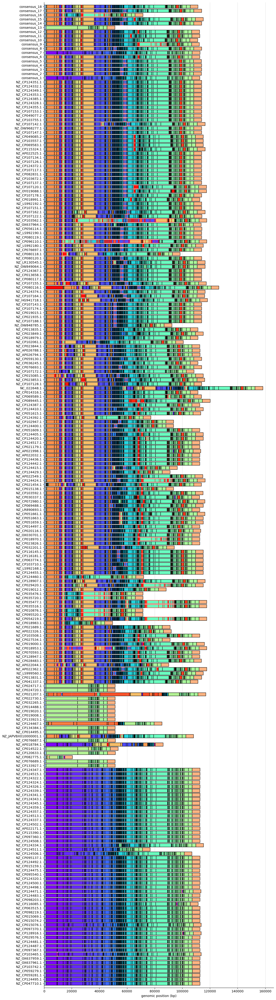

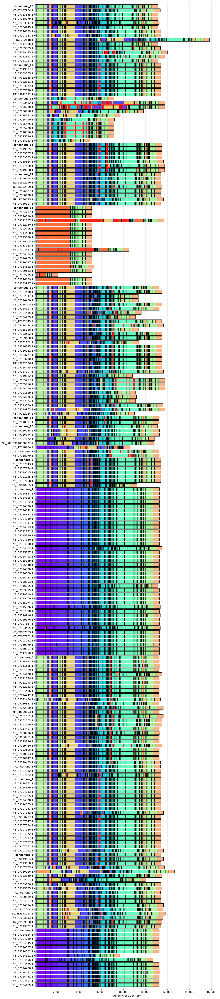

In [ ]:
example_junction = "RYYAQMEJGY_r__ZTHKZYHPIX_f"
example_pangraph = pp.Pangraph.from_json(f"../results/junction_pangraphs/{example_junction}.json")

consensus_paths, path_dict, similarity_matrix, assignment_df = find_consensus_paths(example_pangraph, rare_block_threshold=10, rare_edge_threshold=5)
plot_junction_pangraph(example_pangraph, True, consensus_paths)
plot_junction_pangraph_grouped(example_pangraph, consensus_paths, assignment_df)

# TODO: check whether all paths are ordered to correct consensus, technically each consensus path should belong to at least 5 isolates (not really the case, think about it!)
# checks that all blocks exist at least 5 times and all edges do but their could be a combination of different paths, where this is true in different positions of isolates but not for 5 complete paths
# consensus paths are always real paths, thats why at least it each consensuis path has to have a minimum of 1 match

Found 3 unique paths.


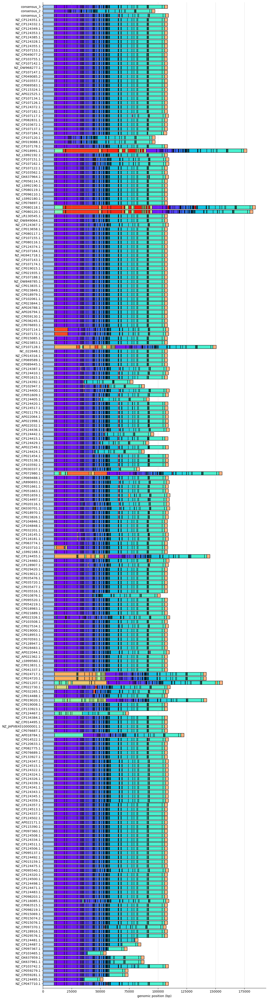

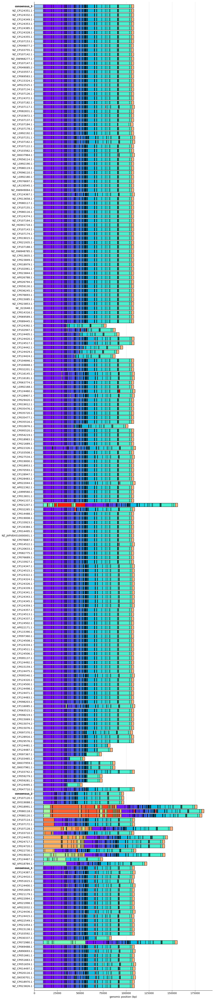

In [103]:
example_junction = "EJPOGALASQ_f__KUIFCLFQSI_r"
example_pangraph = pp.Pangraph.from_json(f"../results/junction_pangraphs/{example_junction}.json")

consensus_paths, path_dict, similarity_matrix, assignment_df = find_consensus_paths(example_pangraph, rare_block_threshold=15, rare_edge_threshold=10)
plot_junction_pangraph(example_pangraph, True, consensus_paths)
plot_junction_pangraph_grouped(example_pangraph, consensus_paths, assignment_df)

Found 3 unique paths.


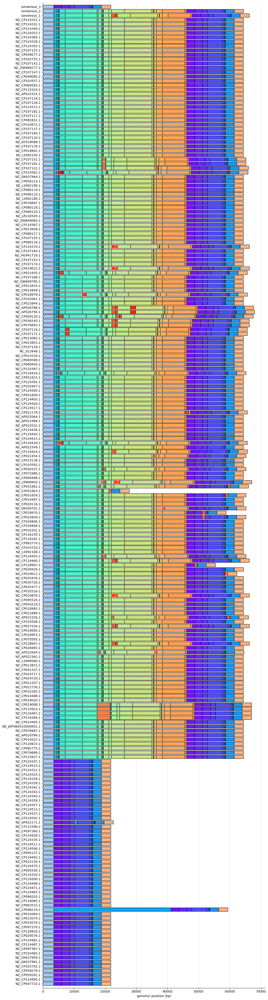

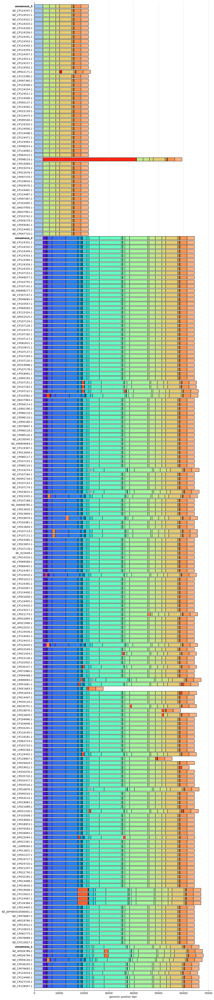

In [ ]:
example_junction = "CIRMBUYJFK_f__CWCCKOQCWZ_r"
example_pangraph = pp.Pangraph.from_json(f"../results/junction_pangraphs/{example_junction}.json")

consensus_paths, path_dict, similarity_matrix, assignment_df = find_consensus_paths(example_pangraph, rare_block_threshold=5, rare_edge_threshold=5)
plot_junction_pangraph(example_pangraph, True, consensus_paths)
plot_junction_pangraph_grouped(example_pangraph, consensus_paths, assignment_df)

# TODO: in second plot consensus paths sometimes get different block coloring, maybe keep the same over all blocks

Found 3 unique paths.


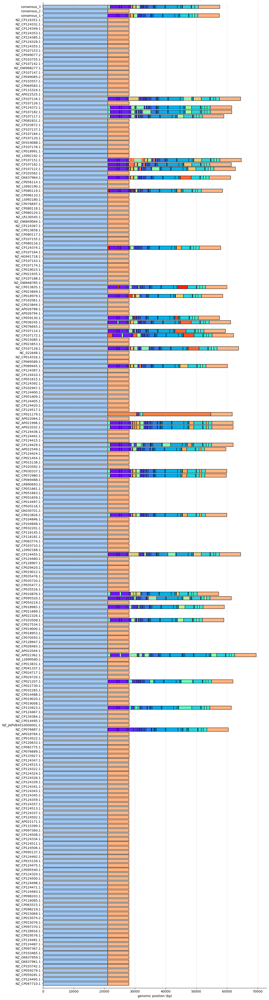

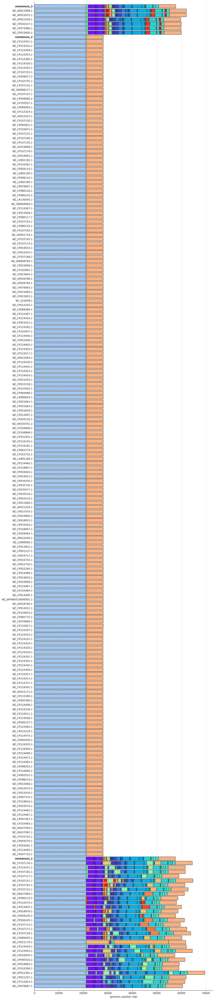

In [105]:
example_junction = "ATPWUNKKID_f__KKPYPKGMXA_f"
example_pangraph = pp.Pangraph.from_json(f"../results/junction_pangraphs/{example_junction}.json")

consensus_paths, path_dict, similarity_matrix, assignment_df = find_consensus_paths(example_pangraph, rare_block_threshold=10, rare_edge_threshold=10)
plot_junction_pangraph(example_pangraph, True, consensus_paths)
plot_junction_pangraph_grouped(example_pangraph, consensus_paths, assignment_df)

## Clustering

In [74]:
# TODO: cluster each path by similarity to its consensus path and plot consensus path with its isolates



In [75]:
# filter out blocks with less than 5 counts
low_count_threshold = 5
blockstats_df = example_pangraph.to_blockstats_df()
blockstats_df = blockstats_df.sort_values("count", ascending=True)

In [76]:


# Create graph directly from adjacency matrix
  # creates nodes 0,1,2,3,4
# If you want to rename nodes:
#mapping = {i: nodes[i] for i in range(len(nodes))}
#G2 = nx.relabel_nodes(G2, mapping)

# Draw
G2 = nx.from_numpy_array(edge_matrix, create_using=nx.DiGraph)
G2.remove_nodes_from(list(nx.isolates(G2)))
# Layout
pos = nx.spring_layout(G2)

# Draw the graph
plt.figure(figsize=(10, 8))
nx.draw(G2, pos, with_labels=True, node_color="lightgreen", node_size=100)

# --- Add edge labels (weights) ---
edge_labels = nx.get_edge_attributes(G2, 'weight')  # extract weights from edges
nx.draw_networkx_edge_labels(G2, pos, edge_labels=edge_labels, font_size=7)

plt.show()


NameError: name 'edge_matrix' is not defined

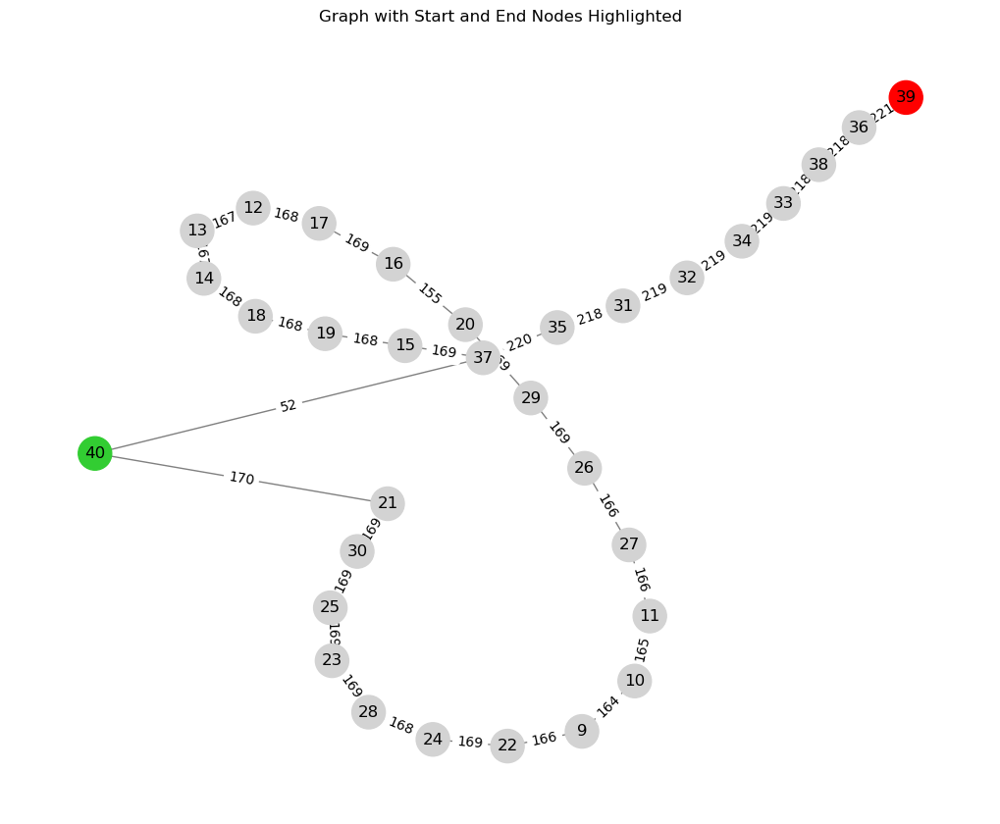

In [ ]:
G = nx.from_numpy_array(edge_matrix)
G.remove_nodes_from(list(nx.isolates(G)))

# Define start and end nodes
first_key = next(iter(paths_blocks))
start_node = paths_blocks[first_key][0]
end_node = paths_blocks[first_key][-1]

start_node = node_to_idx[start_node]
end_node = node_to_idx[end_node]

pos = nx.spring_layout(G, seed=42)
pos[start_node][0] = -1.0  # shift left
pos[end_node][0] = +1.0    # shift right

# Node colors (highlight start and end)
node_colors = []
for node in G.nodes():
    if node == start_node:
        node_colors.append("limegreen")  # start
    elif node == end_node:
        node_colors.append("red")        # goal
    else:
        node_colors.append("lightgray")

plt.figure(figsize=(10, 8))
# Draw nodes and edges
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=600, edge_color="gray")

# Label edges with weights (if any)
edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

plt.title("Graph with Start and End Nodes Highlighted")
plt.show()


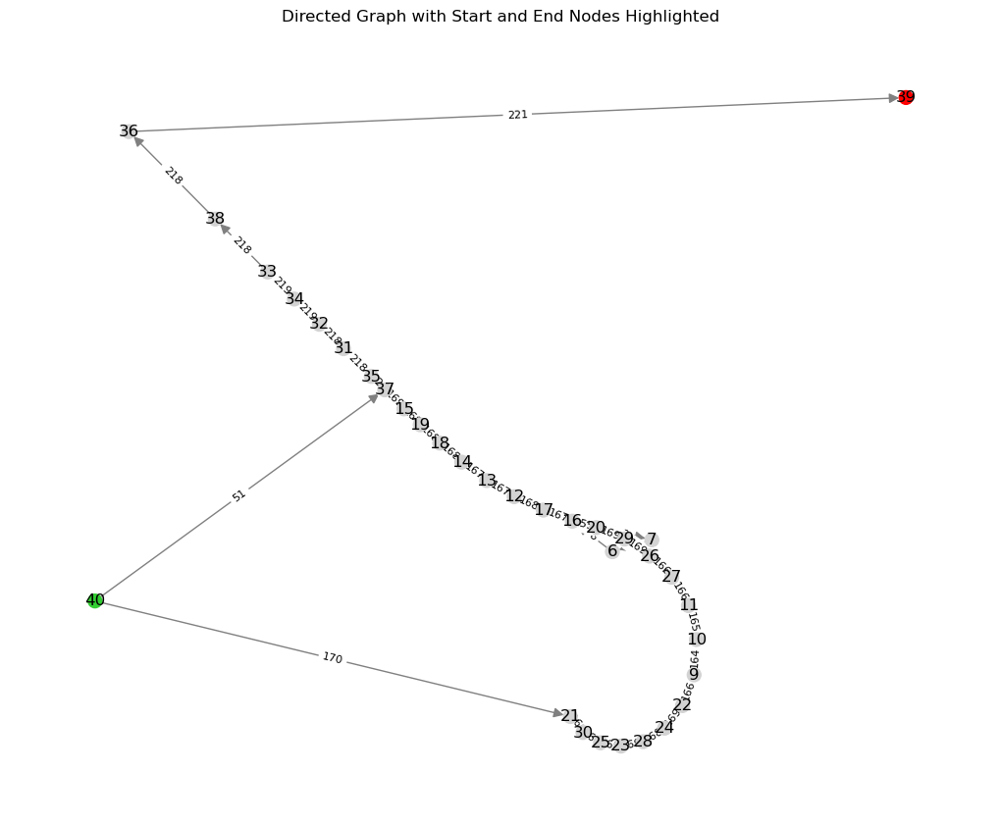

In [ ]:
# Create a directed graph from the adjacency matrix
G = nx.from_numpy_array(edge_matrix, create_using=nx.DiGraph)
G.remove_nodes_from(list(nx.isolates(G)))

# Define start and end nodes
first_key = next(iter(paths_blocks))
start_node = paths_blocks[first_key][0]
end_node = paths_blocks[first_key][-1]

start_node = node_to_idx[start_node]
end_node = node_to_idx[end_node]

# Layout
pos = nx.spring_layout(G, seed=42)
pos[start_node][0] = -1.0  # shift left
pos[end_node][0] = +1.0    # shift right

# Node colors
node_colors = []
for node in G.nodes():
    if node == start_node:
        node_colors.append("limegreen")
    elif node == end_node:
        node_colors.append("red")
    else:
        node_colors.append("lightgray")

plt.figure(figsize=(10, 8))

# --- Draw directed graph ---
nx.draw(
    G,
    pos,
    with_labels=True,
    node_color=node_colors,
    node_size=100,
    edge_color="gray",
    arrows=True,          # show arrows
    arrowstyle="-|>",     # customize arrow look
    arrowsize=15          # arrow size
)

# Add edge labels (weights)
edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=8)

plt.title("Directed Graph with Start and End Nodes Highlighted")
plt.show()


In [ ]:
for element in np.where(edge_matrix[:,node_to_idx[block_id]] == 0)[0]:
    print(element)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40


In [ ]:
# can be used to find out which isolates belong to consensus path in the end
example_pangraph.to_blockcount_df().head()

path_id,NZ_CP096110.1,NZ_CP014497.1,NZ_CP014495.1,NZ_CP124326.1,NZ_CP107147.1,NZ_CP124339.1,NZ_LS999560.1,NZ_OX030701.1,NZ_CP124322.1,NZ_CP021935.1,...,NZ_CP032201.1,NZ_CP124511.1,NZ_CP128907.1,NZ_CP015069.1,NZ_CP107184.1,NZ_CP080118.1,NZ_CP102061.1,NZ_CP124400.1,NZ_CP035516.1,NZ_CP107151.1
block_id,,,,,,,,,,,,,,,,,,,,,
185719230501067033,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
517157241956952768,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
693804415432571803,1,1,1,0,1,0,1,1,0,1,...,1,0,1,0,1,1,1,1,1,1
913783977968963568,1,1,1,0,1,0,1,1,0,1,...,1,0,1,0,1,1,1,1,1,1
964531385716605116,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
